# Download A Small Dataset & Display Point Labels

Necessary Libraries

In [ ]:
from sqapi.api import SQAPI
import csv
import json

# Variables
host = "https://squidle.org"
api_key = "Your API Key Here"  # Get this from your Squidle+ account

# Connect to Squidle+
api = SQAPI(host=host, api_key=api_key, verbosity=1)

Squidle Query

In [2]:
# Initialize variables for pagination
page = 1
all_annotations = []
page_size = 100  # Number of items per page
annotation_set_id = 8114

# 8114 South East Queensland 2010 Dataset
# 8119 #Western Australia 2013 Dataset 
# 8115 Tasmania 2008
# 8120 #Western Australia 2011 Dataset

while True:
    try:
        # Fetch annotations for a specific set and page
        annotation_response = api.get(f"/api/annotation?page={page}&page_size={page_size}").filter("annotation_set_id", "eq", annotation_set_id).execute().json() 
        data = annotation_response.get('objects', [])
        #print(json.dumps(all_annotations, indent=4))

        if page >= annotation_response.get('total_pages', 1):
            break
        #print(annotation_response.get('total_pages', 1))

        all_annotations.extend(data)
        page += 1  # Move to the next page

        #print(page)
    except Exception as e:
        print(f"Failed to fetch annotations: {e}")
        break

# Optional: Print the annotation response to inspect the structure
print(json.dumps(all_annotations, indent=4))

HTTP-GET: /api/annotation?page=1&page_size=100 ... ✅ | 200 | Done in 0.20 s
HTTP-GET: /api/annotation?page=2&page_size=100 ... ✅ | 200 | Done in 0.29 s
HTTP-GET: /api/annotation?page=3&page_size=100 ... ✅ | 200 | Done in 0.16 s
HTTP-GET: /api/annotation?page=4&page_size=100 ... ✅ | 200 | Done in 0.19 s
HTTP-GET: /api/annotation?page=5&page_size=100 ... ✅ | 200 | Done in 0.24 s
HTTP-GET: /api/annotation?page=6&page_size=100 ... ✅ | 200 | Done in 0.23 s
HTTP-GET: /api/annotation?page=7&page_size=100 ... ✅ | 200 | Done in 0.15 s
HTTP-GET: /api/annotation?page=8&page_size=100 ... ✅ | 200 | Done in 0.15 s
HTTP-GET: /api/annotation?page=9&page_size=100 ... ✅ | 200 | Done in 0.21 s
HTTP-GET: /api/annotation?page=10&page_size=100 ... ✅ | 200 | Done in 0.17 s
HTTP-GET: /api/annotation?page=11&page_size=100 ... ✅ | 200 | Done in 0.24 s
HTTP-GET: /api/annotation?page=12&page_size=100 ... ✅ | 200 | Done in 0.14 s
HTTP-GET: /api/annotation?page=13&page_size=100 ... ✅ | 200 | Done in 0.15 s
HTTP-GET

Save Annotations to CSV

In [3]:
# Write annotations to CSV
csv_file_path = 'SEQ_Manual_Annotations_From_API.csv'
with open(csv_file_path, mode="w", newline="") as file:
    writer = csv.writer(file)
    
    # Write the header
    writer.writerow(["id","lineage" ,"label", "point_x", "point_y"])

    # Write each annotation's data
    for annotation in all_annotations:
        writer.writerow([
            annotation.get('point', {}).get('media_id', 'N/A'),
            annotation.get('label', {}).get('lineage_names', 'N/A'),
            annotation.get('label', {}).get('name', 'N/A'),
            annotation.get('point', {}).get('x', 'N/A'),
            annotation.get('point', {}).get('y', 'N/A'),
        ])

print("All pages fetched and saved to CSV.")

All pages fetched and saved to CSV.


Download Images

In [4]:
import pandas as pd
import requests
import os

# Path to your CSV file
csv_path = './SEQ_Squidle_Media.csv'

# Directory to save downloaded images
output_dir = './SEQ_Images'

# Create the directory if it does not exist
os.makedirs(output_dir, exist_ok=True)

# Read the CSV file
df = pd.read_csv(csv_path)

# Iterate over each row in the DataFrame
for index, row in df.iterrows():
    image_url = row['path_best']
    image_id = row['id']
    
    # Make a GET request to download the image
    response = requests.get(image_url, stream=True)
    
    if response.status_code == 200:
        # Construct the file path
        file_path = os.path.join(output_dir, f"{image_id}.jpg")
        
        # Write the image to the file
        with open(file_path, 'wb') as file:
            for chunk in response.iter_content(1024):
                file.write(chunk)
                
        #print(f"Downloaded and saved: {file_path}")
    else:
        print(f"Failed to download image: {image_url}")

View 10 Images

Total images downloaded: 501
Image path: ./SEQ_Images\1072130.jpg
Image path: ./SEQ_Images\1072152.jpg
Image path: ./SEQ_Images\1072183.jpg
Image path: ./SEQ_Images\1072214.jpg
Image path: ./SEQ_Images\1072243.jpg
Image path: ./SEQ_Images\1072268.jpg
Image path: ./SEQ_Images\1072293.jpg
Image path: ./SEQ_Images\1072317.jpg
Image path: ./SEQ_Images\1072341.jpg
Image path: ./SEQ_Images\1072366.jpg


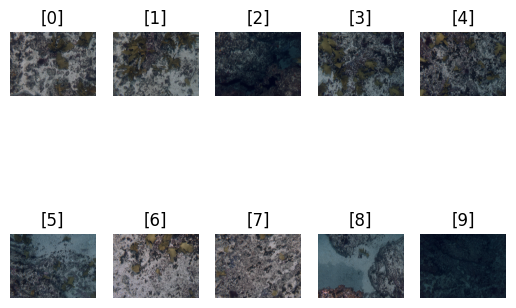

In [5]:
# View 10 images
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from PIL import Image

# The following means the images are actually jpegs
# with open('./SEQ_Images/1072130.png', 'rb') as f:
#     header = f.read(10)
#     print(header)

# Path to the directory containing images
image_dir = './SEQ_Images'

# List all image files in the directory
image_files = os.listdir(image_dir)

print(f"Total images downloaded: {len(image_files)}")

# View the first 10 images
for i in range(10):
    img_path = os.path.join(image_dir, image_files[i])
    print(f"Image path: {img_path}")
    img = Image.open(img_path)
    
    plt.subplot(2, 5, i + 1)
    plt.imshow(img)
    plt.axis('off')
    plt.title([i])

View Images with Annotations

Image path: ./SEQ_Images\1072130.jpg
Matched annotation found
Matched annotation found
Matched annotation found
Matched annotation found
Matched annotation found
Matched annotation found
Matched annotation found
Matched annotation found
Matched annotation found
Matched annotation found
Matched annotation found
Matched annotation found
Matched annotation found
Matched annotation found
Matched annotation found
Matched annotation found
Matched annotation found
Matched annotation found
Matched annotation found
Matched annotation found


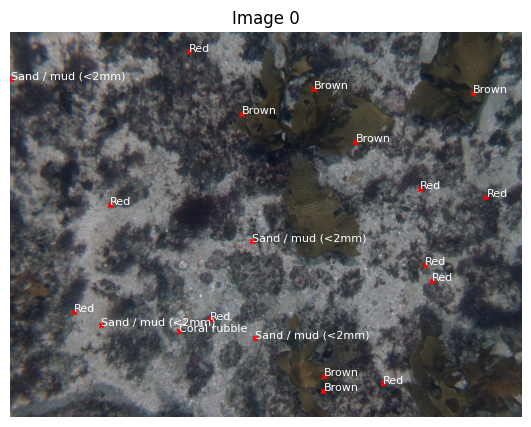

Image path: ./SEQ_Images\1072152.jpg
Matched annotation found
Matched annotation found
Matched annotation found
Matched annotation found
Matched annotation found
Matched annotation found
Matched annotation found
Matched annotation found
Matched annotation found
Matched annotation found
Matched annotation found
Matched annotation found
Matched annotation found
Matched annotation found
Matched annotation found
Matched annotation found
Matched annotation found
Matched annotation found
Matched annotation found
Matched annotation found


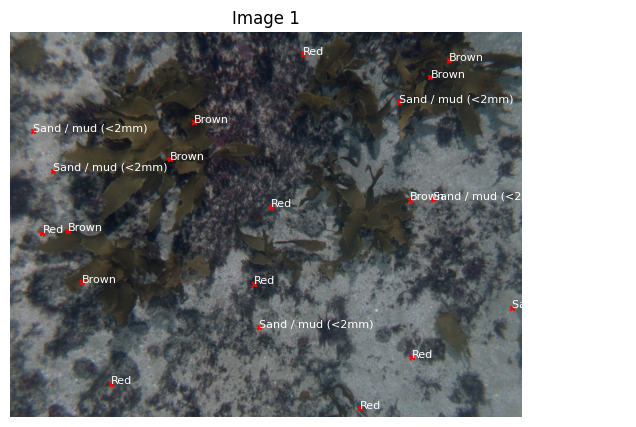

Image path: ./SEQ_Images\1072183.jpg
Matched annotation found
Matched annotation found
Matched annotation found
Matched annotation found
Matched annotation found
Matched annotation found
Matched annotation found
Matched annotation found
Matched annotation found
Matched annotation found
Matched annotation found
Matched annotation found
Matched annotation found
Matched annotation found
Matched annotation found
Matched annotation found
Matched annotation found
Matched annotation found
Matched annotation found
Matched annotation found


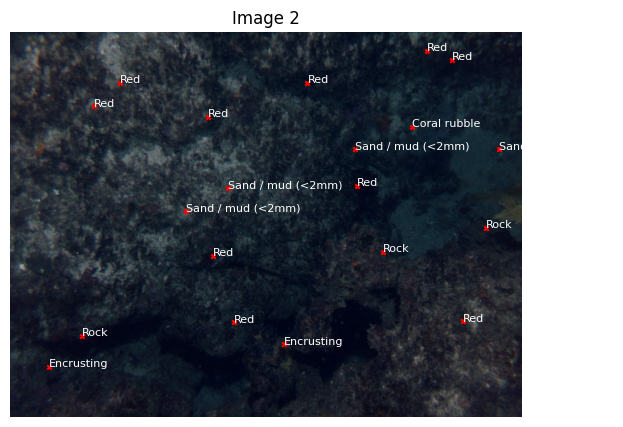

In [6]:
# Set df to the CSV file
df = pd.read_csv(csv_file_path)

# View the first 3 images with annotations
for i in range(3):
    img_path = os.path.join(image_dir, image_files[i])
    print(f"Image path: {img_path}")
    img = Image.open(img_path)

    # Create the figure before plotting anything
    plt.figure(figsize=(10, 5))
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"Image {i}")

    # Add annotations from the CSV
    for index, row in df.iterrows():
        img_id = str(row['id']).strip()
        current_id = image_files[i].split('.')[0]

        if img_id == current_id:
            print("Matched annotation found")
            # Un-normalise point coordinates
            px = row['point_x'] * img.width
            py = row['point_y'] * img.height

            plt.scatter(px, py, c='red', s=10, marker='x')
            plt.text(px, py, row['label'], color='white', fontsize=8)

    plt.show()